In [1]:
from pathlib import Path

In [2]:
plot_base_path = Path(
    "/Users/larsankile/Library/CloudStorage/Dropbox/Apps/Overleaf/[arXiv] From Imitation to Refinement"
    # "/Users/larsankile/Downloads"
)
fileformat = "pdf"  # "pdf", "png", "svg"

(plot_base_path / "fig").mkdir(exist_ok=True)
(plot_base_path / "appendix_fig").mkdir(exist_ok=True)

save = True

In [3]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np

# Set the font family to Times New Roman
plt.rcParams["font.family"] = "Times New Roman"

# Analyze Distillation Scaling


In [4]:
def plot_scaling_plot(
    task,
    num_demonstrations_bc,
    distilled_success_rate,
    unchunked_success_rate,
    rl_success_rate,
    num_demonstrations_dagger=None,
    dagger_success_rate=None,
    highest_exponent=5,
    fig_folder="fig",
):
    # Create the line plot
    plt.figure(figsize=(5, 3.5))

    plt.axhline(
        y=rl_success_rate,
        linestyle="--",
        linewidth=3,
        color="#2398DA",
        label="ResiP (Ours)",
    )

    # Plot the DAgger success rate
    if num_demonstrations_dagger is not None and dagger_success_rate is not None:
        plt.plot(
            num_demonstrations_dagger,
            dagger_success_rate,
            marker="o",
            linestyle="-",
            linewidth=3,
            markersize=8,
            label="DAgger",
            color="#F9A65A",
        )

    # Plot the BC distillation success rate
    plt.plot(
        num_demonstrations_bc,
        distilled_success_rate,
        marker="o",
        linestyle="-",
        linewidth=3,
        markersize=8,
        label="Chunked BC",
        color="#E34A6F",
    )

    # Make a plot of what happens for unchunked base policy
    plt.axhline(
        y=unchunked_success_rate,
        linestyle="--",
        linewidth=3,
        color="#6B529C",
        label="Vanilla BC",
    )

    # Add labels and title
    plt.xlabel("Number of Demonstrations", fontsize=16)

    # Set x-axis to logarithmic scale
    plt.xscale("log")

    # Set y-axis labels
    plt.ylabel("Success Rate (%)", fontsize=16)

    # Set x-axis tick labels as exponents of 10
    plt.xticks(
        [10, 100, 1_000, 10_000, 100_000][0:highest_exponent],
        ["$10^1$", "$10^2$", "$10^3$", "$10^4$", "$10^5$"][0:highest_exponent],
        fontsize=16,
    )

    # Add legend with task as header
    plt.legend(
        title=task,
        title_fontsize=16,
        fontsize=14,
        frameon=False,
        handletextpad=0.2,
    )

    # Set y-axis limits
    plt.ylim(-2, 100)
    plt.xlim(40, np.power(10, highest_exponent) * 1.2)

    # Set y-ticks font size
    plt.yticks(fontsize=16)

    # Set y-ticks to be increments of 25
    plt.yticks(np.arange(0, 101, 25))

    # Add grid lines
    plt.grid(axis="y", linestyle="--", linewidth=0.5, zorder=1)

    # Remove the border around the plot
    plt.box(False)

    # Adjust the layout
    plt.tight_layout()

    # Save the figure as whatever is specified in the fileformat variable
    if save:
        plt.savefig(
            (plot_base_path / fig_folder / f"scaling_{task}").with_suffix(
                f".{fileformat}"
            ),
            dpi=300,
            bbox_inches="tight",
        )

    # Display the plot
    plt.show()

In [7]:
def plot_scaling_plot(
    task,
    num_demonstrations_bc,
    distilled_success_rate,
    unchunked_success_rate,
    rl_success_rate,
    num_demonstrations_dagger=None,
    dagger_success_rate=None,
    highest_exponent=5,
    fig_folder="fig",
):
    # Create the line plot
    plt.figure(figsize=(5, 3.5))

    # Replace axhline with plot for ResiP line
    plt.plot(
        [50, np.power(10, highest_exponent) * 1.2],  # Start at x=50
        [rl_success_rate, rl_success_rate],
        linestyle="--",
        linewidth=3,
        color="#2398DA",
        label="ResiP (Ours)",
    )
    # Add dot at starting point
    plt.plot(
        50,
        rl_success_rate,
        marker="o",
        markersize=8,
        color="#2398DA",
    )

    # Plot the DAgger success rate
    if num_demonstrations_dagger is not None and dagger_success_rate is not None:
        plt.plot(
            num_demonstrations_dagger,
            dagger_success_rate,
            marker="o",
            linestyle="-",
            linewidth=3,
            markersize=8,
            label="DAgger",
            color="#F9A65A",
        )

    # Plot the BC distillation success rate
    plt.plot(
        num_demonstrations_bc,
        distilled_success_rate,
        marker="o",
        linestyle="-",
        linewidth=3,
        markersize=8,
        label="Chunked BC",
        color="#E34A6F",
    )

    # Replace axhline with plot for Vanilla BC line
    plt.plot(
        [50, np.power(10, highest_exponent) * 1.2],  # Start at x=50
        [unchunked_success_rate, unchunked_success_rate],
        linestyle="--",
        linewidth=3,
        color="#6B529C",
        label="Vanilla BC",
    )
    # Add dot at starting point
    plt.plot(
        50,
        unchunked_success_rate,
        marker="o",
        markersize=8,
        color="#6B529C",
    )

    # Add labels and title
    plt.xlabel("Number of Demonstrations", fontsize=16)

    # Set x-axis to logarithmic scale
    plt.xscale("log")

    # Set y-axis labels
    plt.ylabel("Success Rate (%)", fontsize=16)

    # Set x-axis tick labels as exponents of 10
    plt.xticks(
        [10, 100, 1_000, 10_000, 100_000][0:highest_exponent],
        ["$10^1$", "$10^2$", "$10^3$", "$10^4$", "$10^5$"][0:highest_exponent],
        fontsize=16,
    )

    # Add legend with task as header
    plt.legend(
        title=task,
        title_fontsize=14,
        fontsize=12,
        frameon=False,
        handletextpad=0.2,
    )

    # Set y-axis limits
    plt.ylim(-2, 100)
    plt.xlim(40, np.power(10, highest_exponent) * 1.2)

    # Set y-ticks font size
    plt.yticks(fontsize=16)

    # Set y-ticks to be increments of 25
    plt.yticks(np.arange(0, 101, 25))

    # Add grid lines
    plt.grid(axis="y", linestyle="--", linewidth=0.5, zorder=1)

    # Remove the border around the plot
    plt.box(False)

    # Adjust the layout
    plt.tight_layout()

    # Save the figure as whatever is specified in the fileformat variable
    if save:
        plt.savefig(
            (plot_base_path / fig_folder / f"scaling_{task}").with_suffix(
                f".{fileformat}"
            ),
            dpi=300,
            bbox_inches="tight",
        )

    # Display the plot
    plt.show()

#### `one_leg`


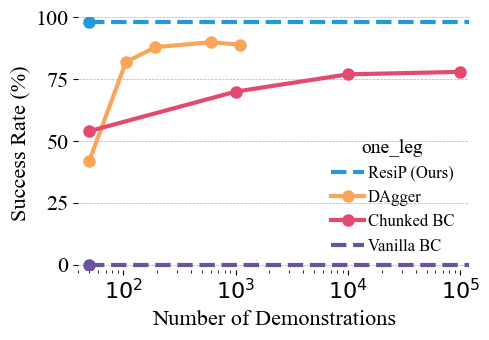

In [8]:
# Scaling of BC distillation
num_demonstrations_bc = [50, 1_000, 10_000, 100_000]
distilled_success_rate = [54, 70, 77, 78]

# Scaling of DAgger
num_demonstrations_dagger = [50, 106, 194, 600, 1100]
dagger_success_rate = [42, 82, 88, 90, 89]

# Horizontal lines
rl_success_rate = 98
unchunked_success_rate = 0

plot_scaling_plot(
    task="one_leg",
    num_demonstrations_bc=num_demonstrations_bc,
    distilled_success_rate=distilled_success_rate,
    unchunked_success_rate=unchunked_success_rate,
    rl_success_rate=rl_success_rate,
    num_demonstrations_dagger=num_demonstrations_dagger,
    dagger_success_rate=dagger_success_rate,
)

#### `factory_peg_hole`


In [12]:
# Scaling of BC distillation
num_demonstrations_bc = [50, 100, 150, 1000, 10_000]
distilled_success_rate = [6, 17, 36, 42, 32]

# Scaling of DAgger
num_demonstrations_dagger = [62, 124, 187, 250, 435, 556, 984, 1465, 2501, 3474, 4257]
dagger_success_rate = [2, 7, 17, 25, 61, 72, 77, 84, 79, 81, 83]

# Horizontal lines
rl_success_rate = 99
unchunked_success_rate = 2

plot_scaling_plot(
    task="peg_hole",
    num_demonstrations_bc=num_demonstrations_bc,
    distilled_success_rate=distilled_success_rate,
    unchunked_success_rate=unchunked_success_rate,
    rl_success_rate=rl_success_rate,
    num_demonstrations_dagger=num_demonstrations_dagger,
    dagger_success_rate=dagger_success_rate,
    highest_exponent=4,
    fig_folder="appendix_fig",
)

<IPython.core.display.Javascript object>

NameError: name 'save' is not defined

#### `lamp`


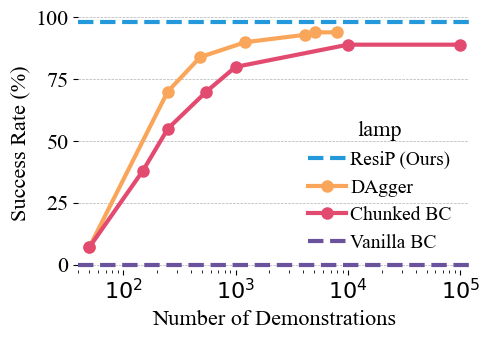

In [45]:
# Scaling of BC distillation
num_demonstrations_bc = [50, 150, 250, 550, 1_000, 10_000, 100_000]
distilled_success_rate = [7, 38, 55, 70, 80, 89, 89]

# Scaling of DAgger
# num_demonstrations_dagger = [58, 72, 130, 187, 249, 399]
# dagger_success_rate = [19, 26, 48, 57, 74, 79]
num_demonstrations_dagger = [50, 249, 486, 1220, 4154, 5127, 8054]
dagger_success_rate = [7, 70, 84, 90, 93, 94, 94]

# Horizontal lines
rl_success_rate = 98
unchunked_success_rate = 0

plot_scaling_plot(
    task="lamp",
    num_demonstrations_bc=num_demonstrations_bc,
    distilled_success_rate=distilled_success_rate,
    unchunked_success_rate=unchunked_success_rate,
    rl_success_rate=rl_success_rate,
    num_demonstrations_dagger=num_demonstrations_dagger,
    dagger_success_rate=dagger_success_rate,
    highest_exponent=5,
    fig_folder="appendix_fig",
)

#### `round_table`


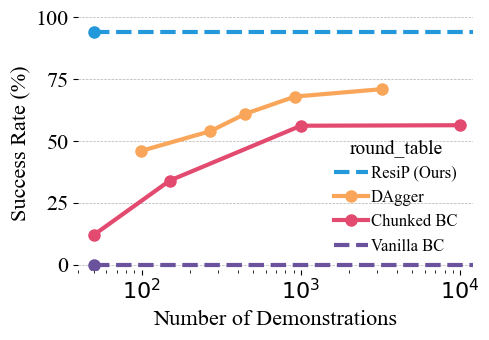

In [10]:
# Scaling of BC distillation
num_demonstrations_bc = [50, 150, 1_000, 10_000]
distilled_success_rate = [12, 34, 56.2, 56.4]

# Scaling of DAgger
num_demonstrations_dagger = [99, 270, 447, 918, 3224]
dagger_success_rate = [46, 54, 61, 68, 71]

# Horizontal lines
rl_success_rate = 94
unchunked_success_rate = 0

plot_scaling_plot(
    task="round_table",
    num_demonstrations_bc=num_demonstrations_bc,
    distilled_success_rate=distilled_success_rate,
    unchunked_success_rate=unchunked_success_rate,
    rl_success_rate=rl_success_rate,
    num_demonstrations_dagger=num_demonstrations_dagger,
    dagger_success_rate=dagger_success_rate,
    highest_exponent=4,
)

In [14]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML


def plot_animated_scaling_plot(
    task,
    num_demonstrations_bc,
    distilled_success_rate,
    unchunked_success_rate,
    rl_success_rate,
    num_demonstrations_dagger=None,
    dagger_success_rate=None,
    highest_exponent=5,
    save_path=None,  # New parameter for saving
):
    # Create the figure
    fig, ax = plt.subplots(figsize=(5, 3.5))

    # Create the base plot setup
    ax.set_xscale("log")
    ax.set_xlabel("Number of Demonstrations", fontsize=16)
    ax.set_ylabel("Success Rate (%)", fontsize=16)
    ax.set_ylim(-2, 100)

    # Set initial x limits to show full range
    ax.set_xlim(40, 10 ** (highest_exponent) * 1.2)

    # Set y-axis ticks
    ax.set_yticks(np.arange(0, 101, 25))
    ax.tick_params(axis="y", labelsize=16)

    # Add grid
    ax.grid(axis="y", linestyle="--", linewidth=0.5, zorder=1)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Initialize Vanilla BC line (visible from start)
    vanilla_line = ax.axhline(
        y=unchunked_success_rate,
        linestyle="--",
        linewidth=3,
        color="#6B529C",
        label="Vanilla BC",
    )

    # Initialize ResiP line (invisible at start)
    resip_line = ax.axhline(
        y=rl_success_rate,
        linestyle="--",
        linewidth=3,
        color="#2398DA",
        label="ResiP (Ours)",
        alpha=0,
    )

    # Create interpolation functions for smooth line drawing
    def interpolate_points(
        x, y, num_points=200
    ):  # Increased number of points for smoother lines
        x = np.log10(x)  # Convert to log scale for interpolation
        from scipy.interpolate import interp1d

        f = interp1d(x, y, kind="linear")
        x_new = np.linspace(x[0], x[-1], num_points)
        y_new = f(x_new)
        return np.power(10, x_new), y_new

    # Interpolate the BC and DAgger data
    bc_x_smooth, bc_y_smooth = interpolate_points(
        num_demonstrations_bc, distilled_success_rate
    )
    if num_demonstrations_dagger is not None and dagger_success_rate is not None:
        dagger_x_smooth, dagger_y_smooth = interpolate_points(
            num_demonstrations_dagger, dagger_success_rate
        )

    # Initialize the lines with empty data
    (chunked_line,) = ax.plot(
        [],
        [],
        marker="",
        linestyle="-",
        linewidth=3,
        label="Chunked BC",
        color="#E34A6F",
    )
    chunked_markers = ax.scatter([], [], marker="o", s=64, color="#E34A6F", zorder=5)

    if num_demonstrations_dagger is not None:
        (dagger_line,) = ax.plot(
            [],
            [],
            marker="",
            linestyle="-",
            linewidth=3,
            label="DAgger",
            color="#F9A65A",
        )
        dagger_markers = ax.scatter([], [], marker="o", s=64, color="#F9A65A", zorder=5)

    # Add initial legend
    legend = ax.legend(
        title=task, title_fontsize=14, fontsize=12, frameon=False, handletextpad=0.2
    )

    def init():
        chunked_line.set_data([], [])
        chunked_markers.set_offsets(np.empty((0, 2)))
        if num_demonstrations_dagger is not None:
            dagger_line.set_data([], [])
            dagger_markers.set_offsets(np.empty((0, 2)))
        return chunked_line, chunked_markers

    def update_legend(frame_portion):
        handles = [vanilla_line]
        if frame_portion >= 0.4:  # After BC animation
            handles.append(chunked_line)
        if (
            frame_portion >= 0.8 and num_demonstrations_dagger is not None
        ):  # After DAgger animation
            handles.append(dagger_line)
        if frame_portion >= 0.95:  # Near the end when ResiP is visible
            handles.append(resip_line)
        ax.legend(
            handles=handles,
            title=task,
            title_fontsize=14,
            fontsize=12,
            frameon=False,
            handletextpad=0.2,
        )

    def animate(frame):
        total_frames = 100
        frame_portion = frame / total_frames

        if frame_portion < 0.4:  # First 40% - animate Chunked BC line
            # Animate x-axis
            current_max = np.exp(
                np.log(40)
                + (frame_portion / 0.4)
                * (np.log(10 ** (highest_exponent) * 1.2) - np.log(40))
            )
            ax.set_xlim(40, current_max)

            bc_progress = frame_portion * 2.5  # Scale to 0-1 over this period
            idx = int(len(bc_x_smooth) * min(bc_progress, 1.0))
            if idx > 0:
                chunked_line.set_data(bc_x_smooth[:idx], bc_y_smooth[:idx])
                # Show markers that we've passed
                marker_indices = [
                    i
                    for i, x in enumerate(num_demonstrations_bc)
                    if x <= bc_x_smooth[idx - 1]
                ]
                if marker_indices:
                    marker_positions = np.column_stack(
                        (
                            np.array(num_demonstrations_bc)[marker_indices],
                            np.array(distilled_success_rate)[marker_indices],
                        )
                    )
                    chunked_markers.set_offsets(marker_positions)

        elif (
            frame_portion < 0.8 and num_demonstrations_dagger is not None
        ):  # Next 40% - animate DAgger line
            ax.set_xlim(40, 10 ** (highest_exponent) * 1.2)  # Keep full range visible
            chunked_line.set_data(
                bc_x_smooth, bc_y_smooth
            )  # Keep BC line fully visible
            chunked_markers.set_offsets(
                np.column_stack((num_demonstrations_bc, distilled_success_rate))
            )

            dagger_progress = (
                frame_portion - 0.4
            ) * 2.5  # Scale to 0-1 over this period
            idx = int(len(dagger_x_smooth) * min(dagger_progress, 1.0))
            if idx > 0:
                dagger_line.set_data(dagger_x_smooth[:idx], dagger_y_smooth[:idx])
                # Show markers that we've passed
                marker_indices = [
                    i
                    for i, x in enumerate(num_demonstrations_dagger)
                    if x <= dagger_x_smooth[idx - 1]
                ]
                if marker_indices:
                    marker_positions = np.column_stack(
                        (
                            np.array(num_demonstrations_dagger)[marker_indices],
                            np.array(dagger_success_rate)[marker_indices],
                        )
                    )
                    dagger_markers.set_offsets(marker_positions)

        else:  # Final 20% - fade in ResiP line
            # Keep previous lines fully visible
            chunked_line.set_data(bc_x_smooth, bc_y_smooth)
            chunked_markers.set_offsets(
                np.column_stack((num_demonstrations_bc, distilled_success_rate))
            )
            if num_demonstrations_dagger is not None:
                dagger_line.set_data(dagger_x_smooth, dagger_y_smooth)
                dagger_markers.set_offsets(
                    np.column_stack((num_demonstrations_dagger, dagger_success_rate))
                )

            fade_progress = (frame_portion - 0.8) * 5  # Scale to 0-1 over the final 20%
            resip_line.set_alpha(min(1.0, fade_progress))

        # Update x-ticks
        visible_ticks = [
            10**i for i in range(1, highest_exponent + 1) if 10**i <= ax.get_xlim()[1]
        ]
        ax.set_xticks(visible_ticks)
        ax.set_xticklabels(
            [f"$10^{int(np.log10(x))}$" for x in visible_ticks], fontsize=16
        )

        # Update legend progressively
        update_legend(frame_portion)

        return chunked_line, chunked_markers

    # Create animation
    ani = animation.FuncAnimation(
        fig=fig, func=animate, init_func=init, frames=100, interval=50, blit=True
    )

    plt.tight_layout()

    # Save animation if path is provided
    if save_path:
        # Set up the writer
        writer = animation.FFMpegWriter(
            fps=20,  # 20 frames per second
            metadata=dict(artist="Me"),
            bitrate=2000,  # Higher bitrate for better quality
        )

        # Save the animation
        ani.save(save_path, writer=writer)
        print(f"Animation saved to {save_path}")

    return ani

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML


def plot_animated_scaling_plot(
    task,
    num_demonstrations_bc,
    distilled_success_rate,
    unchunked_success_rate,
    rl_success_rate,
    num_demonstrations_dagger=None,
    dagger_success_rate=None,
    highest_exponent=5,
    save_path=None,
    legend_loc="best",
):
    # Previous setup code remains the same...
    fig, ax = plt.subplots(figsize=(5, 3.5))
    ax.set_xscale("log")
    ax.set_xlabel("Number of Demonstrations", fontsize=16)
    ax.set_ylabel("Success Rate (%)", fontsize=16)
    ax.set_ylim(-2, 100)
    ax.set_xlim(40, 10 ** (highest_exponent) * 1.2)
    ax.set_yticks(np.arange(0, 101, 25))
    ax.tick_params(axis="y", labelsize=16)
    visible_ticks = [10**i for i in range(1, highest_exponent + 1)]
    ax.set_xticks(visible_ticks)
    ax.set_xticklabels([f"$10^{int(np.log10(x))}$" for x in visible_ticks], fontsize=16)
    ax.grid(axis="y", linestyle="--", linewidth=0.5, zorder=1)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Initialize Vanilla BC line
    (vanilla_line,) = ax.plot(
        [50, 10 ** (highest_exponent) * 1.2],
        [unchunked_success_rate, unchunked_success_rate],
        linestyle="--",
        linewidth=3,
        color="#6B529C",
        label="Vanilla BC",
    )
    vanilla_dot = ax.scatter(
        50, unchunked_success_rate, color="#6B529C", s=64, zorder=5
    )

    # Create a separate line just for the legend that's always visible
    resip_legend_line = ax.plot(
        [],
        [],  # Empty data
        linestyle="--",
        linewidth=3,
        color="#2398DA",
        label="ResiP (Ours)",
    )[0]

    # Initialize ResiP line for animation (without label)
    (resip_line,) = ax.plot(
        [],
        [],
        linestyle="--",
        linewidth=3,
        color="#2398DA",
        alpha=0,
    )
    resip_dot = ax.scatter(
        50, rl_success_rate, color="#2398DA", s=64, zorder=5, alpha=0, visible=False
    )

    # Initialize Chunked BC line
    (chunked_line,) = ax.plot(
        [],
        [],
        marker="",
        linestyle="-",
        linewidth=3,
        label="Chunked BC",
        color="#E34A6F",
    )
    chunked_markers = ax.scatter([], [], marker="o", s=64, color="#E34A6F", zorder=5)

    # Initialize DAgger line if needed
    if num_demonstrations_dagger is not None:
        (dagger_line,) = ax.plot(
            [],
            [],
            marker="",
            linestyle="-",
            linewidth=3,
            label="DAgger",
            color="#F9A65A",
        )
        dagger_markers = ax.scatter([], [], marker="o", s=64, color="#F9A65A", zorder=5)
    else:
        dagger_line = None
        dagger_markers = None

    # Create the static legend with all items
    legend_handles = [resip_legend_line]
    if dagger_line is not None:
        legend_handles.append(dagger_line)
    legend_handles.extend([chunked_line, vanilla_line])

    ax.legend(
        handles=legend_handles,
        title=task,
        title_fontsize=14,
        fontsize=12,
        frameon=False,
        handletextpad=0.2,
        loc=legend_loc,
    )

    # Remove the legend line from the plot (we only need it in the legend)
    resip_legend_line.remove()

    # Rest of the code remains the same...
    def interpolate_points(x, y, num_points=200):
        x = np.log10(x)
        from scipy.interpolate import interp1d

        f = interp1d(x, y, kind="linear")
        x_new = np.linspace(x[0], x[-1], num_points)
        y_new = f(x_new)
        return np.power(10, x_new), y_new

    bc_x_smooth, bc_y_smooth = interpolate_points(
        num_demonstrations_bc, distilled_success_rate
    )
    if num_demonstrations_dagger is not None and dagger_success_rate is not None:
        dagger_x_smooth, dagger_y_smooth = interpolate_points(
            num_demonstrations_dagger, dagger_success_rate
        )

    def init():
        vanilla_line.set_alpha(0)
        vanilla_dot.set_alpha(0)
        resip_line.set_data([], [])
        resip_dot.set_visible(False)
        chunked_line.set_data([], [])
        chunked_markers.set_offsets(np.empty((0, 2)))
        if num_demonstrations_dagger is not None:
            dagger_line.set_data([], [])
            dagger_markers.set_offsets(np.empty((0, 2)))
        return chunked_line, chunked_markers

    def animate(frame):
        total_frames = 100
        frame_portion = frame / total_frames

        # First 10% - fade in Vanilla BC
        if frame_portion <= 0.1:
            fade_in = frame_portion * 10
            vanilla_line.set_alpha(fade_in)
            vanilla_dot.set_alpha(fade_in)
        else:
            vanilla_line.set_alpha(1)
            vanilla_dot.set_alpha(1)

        if frame_portion < 0.4:  # Animate Chunked BC line
            bc_progress = (frame_portion - 0.1) * 3.33
            idx = int(len(bc_x_smooth) * min(max(bc_progress, 0), 1.0))
            if idx > 0:
                chunked_line.set_data(bc_x_smooth[:idx], bc_y_smooth[:idx])
                marker_indices = [
                    i
                    for i, x in enumerate(num_demonstrations_bc)
                    if x <= bc_x_smooth[idx - 1]
                ]
                if marker_indices:
                    marker_positions = np.column_stack(
                        (
                            np.array(num_demonstrations_bc)[marker_indices],
                            np.array(distilled_success_rate)[marker_indices],
                        )
                    )
                    chunked_markers.set_offsets(marker_positions)

        elif frame_portion < 0.8 and num_demonstrations_dagger is not None:
            chunked_line.set_data(bc_x_smooth, bc_y_smooth)
            chunked_markers.set_offsets(
                np.column_stack((num_demonstrations_bc, distilled_success_rate))
            )

            dagger_progress = (frame_portion - 0.4) * 2.5
            idx = int(len(dagger_x_smooth) * min(dagger_progress, 1.0))
            if idx > 0:
                dagger_line.set_data(dagger_x_smooth[:idx], dagger_y_smooth[:idx])
                marker_indices = [
                    i
                    for i, x in enumerate(num_demonstrations_dagger)
                    if x <= dagger_x_smooth[idx - 1]
                ]
                if marker_indices:
                    marker_positions = np.column_stack(
                        (
                            np.array(num_demonstrations_dagger)[marker_indices],
                            np.array(dagger_success_rate)[marker_indices],
                        )
                    )
                    dagger_markers.set_offsets(marker_positions)

        else:  # Final 20% - fade in ResiP line
            chunked_line.set_data(bc_x_smooth, bc_y_smooth)
            chunked_markers.set_offsets(
                np.column_stack((num_demonstrations_bc, distilled_success_rate))
            )
            if num_demonstrations_dagger is not None:
                dagger_line.set_data(dagger_x_smooth, dagger_y_smooth)
                dagger_markers.set_offsets(
                    np.column_stack((num_demonstrations_dagger, dagger_success_rate))
                )

            fade_progress = (frame_portion - 0.8) * 5
            if fade_progress > 0:
                resip_line.set_data(
                    [50, 10 ** (highest_exponent) * 1.2],
                    [rl_success_rate, rl_success_rate],
                )
                resip_line.set_alpha(min(1.0, fade_progress))
                resip_dot.set_visible(True)
                resip_dot.set_alpha(min(1.0, fade_progress))

        return chunked_line, chunked_markers

    # Create and return animation
    ani = animation.FuncAnimation(
        fig=fig, func=animate, init_func=init, frames=100, interval=50, blit=True
    )

    plt.tight_layout()

    if save_path:
        writer = animation.FFMpegWriter(
            fps=20,
            metadata=dict(artist="Me"),
            bitrate=2000,
        )
        ani.save(save_path, writer=writer)
        print(f"Animation saved to {save_path}")

    return ani

In [26]:
# Example usage
%matplotlib notebook

num_demonstrations_bc = [50, 1_000, 10_000, 100_000]
distilled_success_rate = [54, 70, 77, 78]
num_demonstrations_dagger = [50, 106, 194, 600, 1100]
dagger_success_rate = [42, 82, 88, 90, 89]
rl_success_rate = 98
unchunked_success_rate = 0

ani = plot_animated_scaling_plot(
    task="one_leg",
    num_demonstrations_bc=num_demonstrations_bc,
    distilled_success_rate=distilled_success_rate,
    unchunked_success_rate=unchunked_success_rate,
    rl_success_rate=rl_success_rate,
    num_demonstrations_dagger=num_demonstrations_dagger,
    dagger_success_rate=dagger_success_rate,
    save_path='scaling_plot_one_leg.mp4',
    legend_loc=(0.5, 0.1),
)

HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

Animation saved to scaling_plot_one_leg.mp4


In [24]:
%matplotlib notebook

# Scaling of BC distillation
num_demonstrations_bc = [50, 150, 1_000, 10_000]
distilled_success_rate = [12, 34, 56.2, 56.4]

# Scaling of DAgger
num_demonstrations_dagger = [99, 270, 447, 918, 3224]
dagger_success_rate = [46, 54, 61, 68, 71]

# Horizontal lines
rl_success_rate = 94
unchunked_success_rate = 0

ani = plot_animated_scaling_plot(
    task="round_table",
    num_demonstrations_bc=num_demonstrations_bc,
    distilled_success_rate=distilled_success_rate,
    unchunked_success_rate=unchunked_success_rate,
    rl_success_rate=rl_success_rate,
    num_demonstrations_dagger=num_demonstrations_dagger,
    dagger_success_rate=dagger_success_rate,
    highest_exponent=4,
    save_path="scaling_plot_round_table.mp4",
    legend_loc=(0, 0.25)
)

HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

Animation saved to scaling_plot_round_table.mp4


# Perturbation Analysis


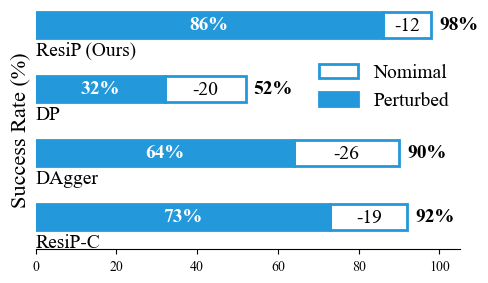

In [4]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams["font.family"] = "Times New Roman"

# Data
methods = [
    "ResiP-C",
    "DAgger",
    "DP",
    "ResiP (Ours)",
]
perturbed = [73, 64, 32, 86]
unperturbed = [92, 90, 52, 98]
drops = [u - p for u, p in zip(unperturbed, perturbed)]

# Create the plot
fig, ax = plt.subplots(figsize=(5, 3))  # Slightly increased height

# Plot the bars
bar_height = 0.4
y_offset = 0.25
y = np.arange(len(methods)) + y_offset
ax.barh(
    y,
    drops,
    bar_height,
    left=perturbed,
    color="none",
    edgecolor="#2398DA",
    linewidth=2,
    label="Nomimal",
)

ax.barh(
    y,
    perturbed,
    bar_height,
    color="#2398DA",
    edgecolor="#2398DA",
    linewidth=2,
    label="Perturbed",
)

# Add labels
for i, (p, u, d) in enumerate(zip(perturbed, unperturbed, drops)):
    # Perturbed label (inside the filled bar)
    y_pos = i + y_offset
    ax.text(
        p / 2,
        y_pos,
        f"{p}%",
        ha="center",
        va="center",
        color="white",
        fontweight="bold",
        fontsize=14,
    )

    # Drop label (in the transparent part)
    ax.text(p + d / 2, y_pos, f"-{d}", ha="center", va="center", fontsize=14)

    # Unperturbed label (at the end)
    ax.text(
        u + 2, y_pos, f"{u}%", ha="left", va="center", fontweight="bold", fontsize=14
    )

    # Method label (below the bar)
    ax.text(
        0, y_pos - 0.25, methods[i], ha="left", va="top", fontsize=14
    )  # Adjusted y-position

# Customize the plot
# ax.set_xlabel("Success Rate (%)", fontsize=16)
ax.set_ylabel("Success Rate (%)", fontsize=16)
ax.set_yticks([])  # Remove y-axis ticks
ax.set_xlim(0, 105)  # Set x-axis limit to allow space for labels

ax.set_ylim(-0.25, len(methods) - 0.5)  # Adjust y-axis limits

ax.spines["left"].set_visible(False)  # Remove left spine
ax.spines["right"].set_visible(False)  # Remove right spine
ax.spines["top"].set_visible(False)  # Remove top spine
ax.legend(loc=(0.65, 0.55), frameon=False, fontsize=14)  # Add legend

# Adjust layout and display
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Increase bottom margin

# Save figure
plt.savefig(
    (plot_base_path / "fig" / "online_perturbation_comparison").with_suffix(
        f".{fileformat}"
    ),
    dpi=300,
    bbox_inches="tight",
)

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np

# Add the Roboto font to Matplotlib's font cache
roboto_path = "/Users/larsankile/Downloads/Roboto/Roboto-Medium.ttf"
fm.fontManager.addfont(roboto_path)
plt.rcParams["font.family"] = "Roboto"

# Data
categories = ["Data Collection", "Task Resets", "Hardware Failures"]
art_data = [95.7, 4.3, 0]
real_world_data = [75.7, 11.4, 12.9]

# Create horizontal stacked bar chart
fig, ax = plt.subplots(figsize=(10, 5))  # Increased figure height to accommodate legend

# ART (Ours) bar
ax.barh(1, art_data[0], color="#4CAF50", label=categories[0])
ax.barh(1, art_data[1], left=art_data[0], color="#FFC107", label=categories[1])
ax.barh(1, art_data[2], left=sum(art_data[:2]), color="#FF5722", label=categories[2])

# Real-world Teleoperation bar
ax.barh(0, real_world_data[0], color="#4CAF50")
ax.barh(0, real_world_data[1], left=real_world_data[0], color="#FFC107")
ax.barh(0, real_world_data[2], left=sum(real_world_data[:2]), color="#FF5722")

# Customize the plot
ax.set_yticks([0, 1])
ax.set_yticklabels(["Real-world\nTeleop", "ART\n(Ours)"], fontsize=18)
ax.set_xlabel("Share of time spent (%)", fontsize=18)

# Add percentage labels on the bars
for i, (art, real) in enumerate(zip(art_data, real_world_data)):
    if art > 0:
        ax.text(
            sum(art_data[:i]) + art / 2,
            1,
            f"{art:.0f}%",
            ha="center",
            va="center",
            fontsize=16,
        )
    if real > 0:
        ax.text(
            sum(real_world_data[:i]) + real / 2,
            0,
            f"{real:.0f}%",
            ha="center",
            va="center",
            fontsize=16,
        )

# Add legend above the bars
legend = ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 1.15),
    ncol=3,
    frameon=False,
    fontsize=18,
)

# Remove the border around the plot
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["bottom"].set_visible(False)


# Adjust layout
plt.tight_layout()

# Adjust the plot to make room for the legend
plt.subplots_adjust(top=0.85)

# Save the figure as a PDF
plt.savefig(
    (
        Path(
            "/Users/larsankile/Library/CloudStorage/Dropbox/Apps/Overleaf/Dexterity-Hub-ICRA2025/images"
        )
        / "time_comparison3"
    ).with_suffix(f".pdf"),
    dpi=300,
    bbox_inches="tight",
)

plt.show()

## BC/RL Distillation


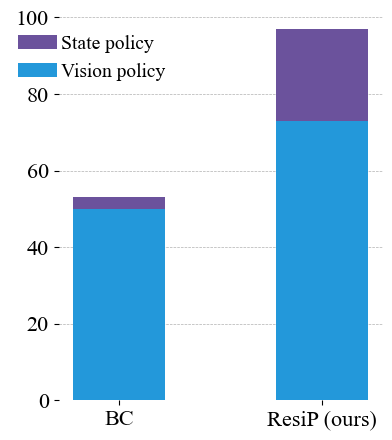

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Data
categories = ["BC", "ResiP (ours)"]
vision_based_student = [50, 73]
total = [53, 97]

# Calculate the state values
state_based_teacher = np.array(total) - np.array(vision_based_student)

# Set the width of each bar
bar_width = 0.45

# Set the positions of the bars on the x-axis
r = range(len(categories))

# Create the stacked bar plot
plt.figure(figsize=(4, 4.5))
plt.bar(
    r,
    state_based_teacher,
    width=bar_width,
    bottom=vision_based_student,
    label="State policy",
    color="#6B529C",
    zorder=2,
)
plt.bar(
    r,
    vision_based_student,
    width=bar_width,
    label="Vision policy",
    color="#2398DA",
    zorder=2,
)
plt.xticks(r, categories, fontsize=16)

# Add legend in upper left
plt.legend(
    loc="upper left",
    fontsize=14,
    frameon=False,
    bbox_to_anchor=(-0.18, 1),
    handletextpad=0.2,
)

plt.box(False)


# Add horizontal grid lines
plt.grid(axis="y", linestyle="--", linewidth=0.5, zorder=1)

# Set y-axis limits
plt.ylim(0, 100)

# Increase the size of the y-axis ticks
plt.yticks(fontsize=16)

# Save figure to base path + distillation.pdf
plt.savefig(
    (plot_base_path / "fig" / "distillation").with_suffix(f".{fileformat}"),
    dpi=300,
    bbox_inches="tight",
)

# Display the plot
plt.tight_layout()
plt.show()

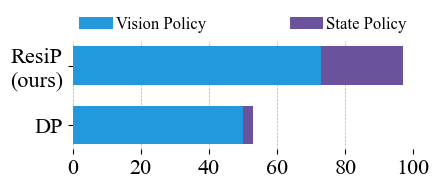

In [17]:
import matplotlib.pyplot as plt
import numpy as np

# Data
categories = ["DP", "ResiP\n(ours)"]
vision_based_student = [50, 73]
total = [53, 97]

# Calculate the state values
state_based_teacher = np.array(total) - np.array(vision_based_student)

# Set the height of each bar
bar_height = 0.65

# Set the positions of the bars on the y-axis
r = range(len(categories))

# Create the stacked bar plot
plt.figure(figsize=(4.5, 2))
plt.barh(
    r,
    vision_based_student,
    height=bar_height,
    label="Vision Policy",
    color="#2398DA",
    zorder=2,
)
plt.barh(
    r,
    state_based_teacher,
    height=bar_height,
    left=vision_based_student,
    label="State Policy",
    color="#6B529C",
    zorder=2,
)
plt.yticks(r, categories, fontsize=16)

# Add legend horizontally above the plot
plt.legend(
    bbox_to_anchor=(0, 1.02, 1, 0.2),
    loc="lower left",
    ncol=2,  # Make legend horizontal
    mode="expand",
    borderaxespad=0.0,
    fontsize=12,
    frameon=False,
    handletextpad=0.2,
)

plt.box(False)

# Add vertical grid lines
plt.grid(axis="x", linestyle="--", linewidth=0.5, zorder=1)

# Set x-axis limits
plt.xlim(0, 100)

# Increase the size of the x-axis ticks
plt.xticks(fontsize=16)

# Save figure to base path + distillation.pdf
plt.savefig(
    (plot_base_path / "fig" / "distillation").with_suffix(f".{fileformat}"),
    dpi=300,
    bbox_inches="tight",
)

# Display the plot
plt.tight_layout()
plt.show()

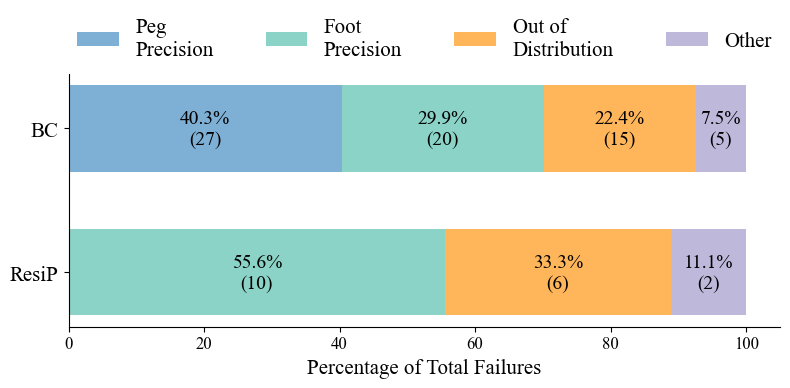

In [67]:
import numpy as np
import matplotlib.pyplot as plt

# Define the categories and their constituent failure modes
categories = {
    "Peg\nPrecision": ["Imprecise peg grasp", "Imprecise peg insert"],
    "Foot\nPrecision": ["Imprecise foot grasp", "Imprecise foot insert"],
    "Out of\nDistribution": [
        "OOD peg grasp",
        "OOD foot grasp",
        "OOD table place",
        "OOD while screwing",
    ],
    "Other": [
        "Sim malfunction",
        "Keeps screwing",
        "Bad foot screw",
        "Timed out after retries",
    ],
}

# Original data
data = {
    "ResiP": {
        "Imprecise peg grasp": 0,
        "Imprecise peg insert": 0,
        "Imprecise foot grasp": 3,
        "Imprecise foot insert": 7,
        "OOD peg grasp": 2,
        "OOD foot grasp": 1,
        "OOD table place": 1,
        "OOD while screwing": 2,
        "Sim malfunction": 1,
        "Keeps screwing": 0,
        "Bad foot screw": 0,
        "Timed out after retries": 1,
    },
    "BC": {
        "Imprecise peg grasp": 7,
        "Imprecise peg insert": 20,
        "Imprecise foot grasp": 16,
        "Imprecise foot insert": 4,
        "OOD peg grasp": 13,
        "OOD foot grasp": 1,
        "OOD table place": 1,
        "OOD while screwing": 0,
        "Sim malfunction": 2,
        "Keeps screwing": 2,
        "Bad foot screw": 1,
        "Timed out after retries": 0,
    },
}

methods = list(data.keys())

# Calculate grouped data and percentages
grouped_data = {}
for method in methods:
    total = sum(data[method].values())
    grouped_data[method] = {}
    for category, modes in categories.items():
        category_sum = sum(data[method][mode] for mode in modes)
        grouped_data[method][category] = {
            "count": category_sum,
            "percentage": (category_sum / total) * 100,
        }

# Create the plot with adjusted dimensions for horizontal layout
fig, ax = plt.subplots(figsize=(8, 4))

# Define softer colors for each category
colors = [
    "#7eb0d5",  # Soft blue
    "#8bd3c7",  # Soft teal
    "#ffb55a",  # Soft orange
    "#beb9db",  # Soft purple
]
colors = {category: color for category, color in zip(categories.keys(), colors)}

# Plot horizontal stacked bars
y_positions = [0, 0.5]  # Positions for BC and RL bars
left_positions = {method: 0 for method in methods}

for category in categories.keys():
    for method, y_pos in zip(methods, y_positions):
        value = grouped_data[method][category]["percentage"]
        count = grouped_data[method][category]["count"]

        ax.barh(
            y_pos,
            value,
            left=left_positions[method],
            label=category if method == "BC" else "",
            color=colors[category],
            height=0.3,
        )

        # Add labels with both percentage and count if segment is large enough
        if value >= 3:
            x_pos = left_positions[method] + value / 2
            ax.text(
                x_pos,
                y_pos,
                f"{value:.1f}%\n({count})",
                ha="center",
                va="center",
                fontsize=14,
            )

        left_positions[method] += value

# Customize plot
plt.xlabel("Percentage of Total Failures", fontsize=15)
ax.set_yticks(y_positions)
ax.set_yticklabels(methods, fontsize=15)

# Change the size of the x-axis ticks
plt.xticks(fontsize=12)

# Position legend above the plot
plt.legend(
    bbox_to_anchor=(0, 1.02, 1, 0.2),
    loc="lower left",
    mode="expand",
    borderaxespad=0,
    ncol=4,
    frameon=False,
    fontsize=15,
)

# Remove top and right spines
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Save the figure as a whatever is specified in the fileformat variable
plt.savefig(
    (plot_base_path / "fig" / "round_table_failure_modes").with_suffix(
        f".{fileformat}"
    ),
    dpi=300,
    bbox_inches="tight",
)

plt.tight_layout()
plt.show()

# Sankey diagram over real-world data


In [ ]:
import sys

print(sys.executable)

In [ ]:
import plotly.graph_objects as go

labels = [
    "Corner (10 / 10)",
    "Grasp (9 / 10)",
    "Insert (6 / 10)",
    "Screw (5 / 10)",
    "Success",
    "Failure",
]

fig = go.Figure(
    data=[
        go.Sankey(
            node=dict(
                pad=15,
                thickness=20,
                line=dict(color="black", width=0.5),
                label=labels,
                color=[
                    "#F4F269",
                    "#CEE26B",
                    "#A8D26D",
                    "#82C26E",
                    "#5CB270",
                    "#A41623",
                ],
                x=[0, 0.25, 0.45, 0.65, 1],
                y=[0, 0.5, 0.4, 0.25, 0.0],
            ),
            link=dict(
                source=[0, 0, 1, 1, 2, 2, 3, 3],
                target=[1, 5, 2, 5, 3, 5, 4, 5],
                value=[10, 0, 9, 1, 6, 3, 5, 1],
                label=["10", "0", "9", "1", "6", "3", "5", "1"],
            ),
            textfont=dict(size=30, family="Times New Roman"),
        )
    ]
)


fig.update_layout(
    margin=dict(l=0, r=0, t=20, b=10),
    height=400,
    width=1000,
)

fig.write_image(str(plot_base_path / "appendix_fig" / "real_success_sankey.pdf"))
fig.show()

# Sim and real data action cross sections


In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Import dimmensionality reduction libraries
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [10]:
sim = np.load("data/sim_actions.npy")
real = np.load("data/real_actions.npy")

In [18]:
dim_names = ["x", "y", "z"]

simcolor = "#2398DA"
realcolor = "#E34A6F"


def plot_cross_section(ax, sim, real, dims):
    d1, d2 = dims

    # Plot the real data
    ax.scatter(real[:, d1], real[:, d2], alpha=0.05, c=realcolor, s=1)
    # Plot the sim data
    ax.scatter(sim[:, d1], sim[:, d2], alpha=0.05, c=simcolor, s=1)

    # Add a legend
    ax.scatter([], [], c=realcolor, label="real")
    ax.scatter([], [], c=simcolor, label="sim")

    ax.legend(frameon=False, fontsize=18)

    ax.set_xlabel(dim_names[dims[0]], fontsize=18)
    ax.set_ylabel(dim_names[dims[1]], fontsize=18)

    # Adjust the tick label font size
    ax.tick_params(axis="both", which="major", labelsize=16)

In [ ]:
# More simply, plot the 3 cross-section position of the end effector for the sim and real data in one plot
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Add some random noise to the data to make the scatter plot more readable
real_dispersed = real  # + np.random.normal(0, 0.001, real.shape)
sim_dispersed = sim  # + np.random.normal(0, 0.001, sim.shape)

plot_cross_section(axs[0], sim_dispersed, real_dispersed, [0, 1])
plot_cross_section(axs[1], sim_dispersed, real_dispersed, [0, 2])
plot_cross_section(axs[2], sim_dispersed, real_dispersed, [1, 2])

# fig.suptitle(
#     "Cross-sections of the end effector position for sim and real data", fontsize=16
# )

plt.tight_layout()

plt.savefig(
    plot_base_path / "appendix_fig" / "sim_real_action_space_crossection.png",
    format="png",
    dpi=300,
)

plt.show()

# MLP vs. DP as Base Model Ablation


In [70]:
import wandb
import matplotlib.pyplot as plt

api = wandb.Api()

In [71]:
def plot_base_ablation(
    dp_run_id,
    mlp_run_id,
    task,
    wandb_project,
):
    run_ids = {
        "DP": dp_run_id,
        "MLP-C": mlp_run_id,
    }

    colors = {
        "DP": "#2398DA",
        "MLP-C": "#E34A6F",
    }

    fig, ax = plt.subplots(figsize=(4, 4))

    for method, run_id in run_ids.items():
        run = api.run(f"huyue233-zhejiang-university/{wandb_project}/{run_id}")
        history = run.history(pandas=False)

        step = [entry["_step"] for entry in history]
        success_rate = [entry["eval/success_rate"] for entry in history]

        series = [
            (step, success_rate)
            for step, success_rate in zip(step, success_rate)
            if success_rate is not None
        ]

        ax.plot(*zip(*series), label=method, color=colors[method], linewidth=2)

    ax.set_xlabel("Environment Step", fontsize=16)
    ax.set_ylabel("Success Rate", fontsize=16)
    ax.legend(frameon=False, fontsize=14, title=task, title_fontsize=14)
    ax.tick_params(axis="both", which="major", labelsize=14)

    plt.tight_layout()

    if save:
        plt.savefig(
            (plot_base_path / "appendix_fig" / f"mlp_base_ablation-{task}").with_suffix(
                f".{fileformat}"
            ),
            dpi=300,
        )

    plt.show()

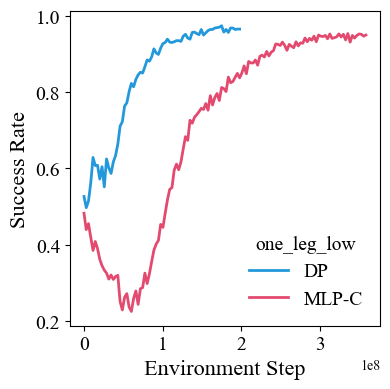

In [72]:
# One leg low
plot_base_ablation(
    dp_run_id="jamz5ley",
    mlp_run_id="a3d0eobj",
    task="one_leg_low",
    wandb_project="ol-rppo-dr-low-1",
)

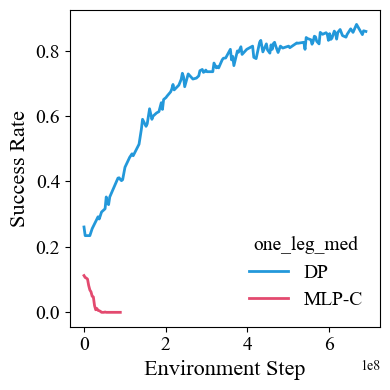

In [73]:
# One leg medium
plot_base_ablation(
    dp_run_id="oipdyimz",
    mlp_run_id="i1peost4",
    task="one_leg_med",
    wandb_project="ol-rppo-dr-med-1",
)

# Chunked Residual Ablation


In [74]:
def plot_chunked_residual_ablation(
    resip_run_id,
    chunked_run_id,
    task,
    wandb_project,
):
    run_ids = {
        "ResiP": resip_run_id,
        "Chunked Residual": chunked_run_id,
    }

    colors = {
        "ResiP": "#2398DA",
        "Chunked Residual": "#E34A6F",
    }

    fig, ax = plt.subplots(figsize=(4, 4))

    for method, run_id in run_ids.items():
        run = api.run(f"huyue233-zhejiang-university/{wandb_project}/{run_id}")
        history = run.history(pandas=False)

        step = [entry["_step"] for entry in history]
        success_rate = [entry["eval/success_rate"] for entry in history]

        series = [
            (step, success_rate)
            for step, success_rate in zip(step, success_rate)
            if success_rate is not None
        ]

        ax.plot(*zip(*series), label=method, color=colors[method], linewidth=2)

    ax.set_xlabel("Environment Step", fontsize=16)
    ax.set_ylabel("Success Rate", fontsize=16)
    ax.legend(frameon=False, fontsize=14, title=task, title_fontsize=14)
    ax.tick_params(axis="both", which="major", labelsize=14)

    plt.tight_layout()

    if save:
        plt.savefig(
            (
                plot_base_path / "appendix_fig" / f"chunked_residual_ablation-{task}"
            ).with_suffix(f".{fileformat}"),
            dpi=300,
        )

    plt.show()

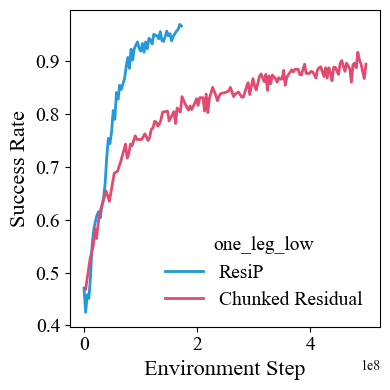

In [75]:
# One leg low
plot_chunked_residual_ablation(
    resip_run_id="pc1sb2zi",
    chunked_run_id="ntrzi1za",
    task="one_leg_low",
    wandb_project="ol-chunked-rppo-dr-low-1",
)

# DP versus ACT ablation


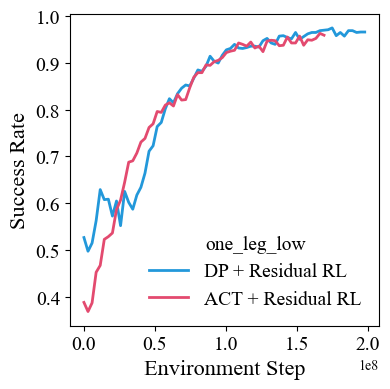

In [76]:
run_ids = {
    "DP + Residual RL": "huyue233-zhejiang-university/ol-rppo-dr-low-1/runs/jamz5ley",
    "ACT + Residual RL": "johnmarangola-/one_leg-residual-rl/runs/yucvpuzk",
}

colors = {
    "DP + Residual RL": "#2398DA",
    "ACT + Residual RL": "#E34A6F",
}

task = "one_leg_low"

fig, ax = plt.subplots(figsize=(4, 4))

for method, run_id in run_ids.items():
    run = api.run(run_id)
    history = run.history(pandas=False)

    step = [entry["_step"] for entry in history]
    success_rate = [entry["eval/success_rate"] for entry in history]

    series = [
        (step, success_rate)
        for step, success_rate in zip(step, success_rate)
        if success_rate is not None
    ]

    ax.plot(*zip(*series), label=method, color=colors[method], linewidth=2)

ax.set_xlabel("Environment Step", fontsize=16)
ax.set_ylabel("Success Rate", fontsize=16)
ax.legend(frameon=False, fontsize=14, title=task, title_fontsize=14)
ax.tick_params(axis="both", which="major", labelsize=14)

plt.tight_layout()

if save:
    plt.savefig(
        (plot_base_path / "appendix_fig" / f"act_base_ablation-{task}").with_suffix(
            f".{fileformat}"
        ),
        dpi=300,
    )

plt.show()

# $\alpha$ Parameter Ablation


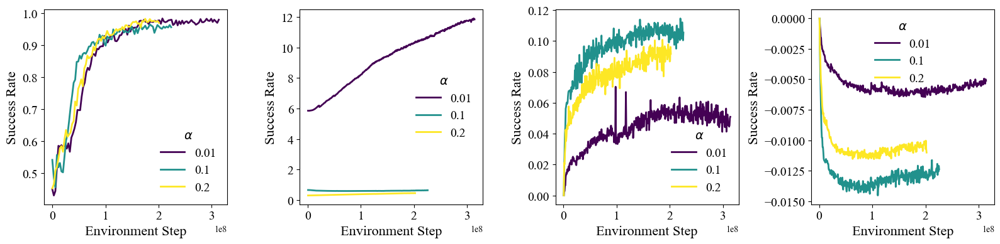

In [83]:
run_ids = {
    "0.01": "wbfg33kr",
    "0.1": "xaoe9h3k",
    "0.2": "8izwp88b",
}

# Make a color map that has a smooth transition
colors = plt.cm.viridis(np.linspace(0, 1, len(run_ids)))

task = "one_leg_low"

# Fields to create plots for
fields = [
    "eval/success_rate",
    "charts/action_norm_mean",
    "losses/clipfrac",
    "losses/policy_loss",
]

fig, axs = plt.subplots(1, len(fields), figsize=(4 * len(fields), 4))


for field, ax in zip(fields, axs):

    for i, (method, run_id) in enumerate(run_ids.items()):
        run = api.run(f"huyue233-zhejiang-university/ol-rppo-dr-low-1/{run_id}")
        history = run.history(pandas=False)

        step = [entry["_step"] for entry in history]
        success_rate = [entry[field] for entry in history]

        series = [
            (step, success_rate)
            for step, success_rate in zip(step, success_rate)
            if success_rate is not None
        ]

        ax.plot(*zip(*series), label=method, color=colors[i], linewidth=2)

    ax.set_xlabel("Environment Step", fontsize=16)
    ax.set_ylabel("Success Rate", fontsize=16)
    ax.legend(frameon=False, fontsize=14, title="$\\alpha$", title_fontsize=14)
    ax.tick_params(axis="both", which="major", labelsize=14)

plt.tight_layout()

if save:
    plt.savefig(
        (plot_base_path / "appendix_fig" / f"alpha_ablation-{task}").with_suffix(
            f".{fileformat}"
        ),
        dpi=300,
    )

plt.show()

# Twitter thread


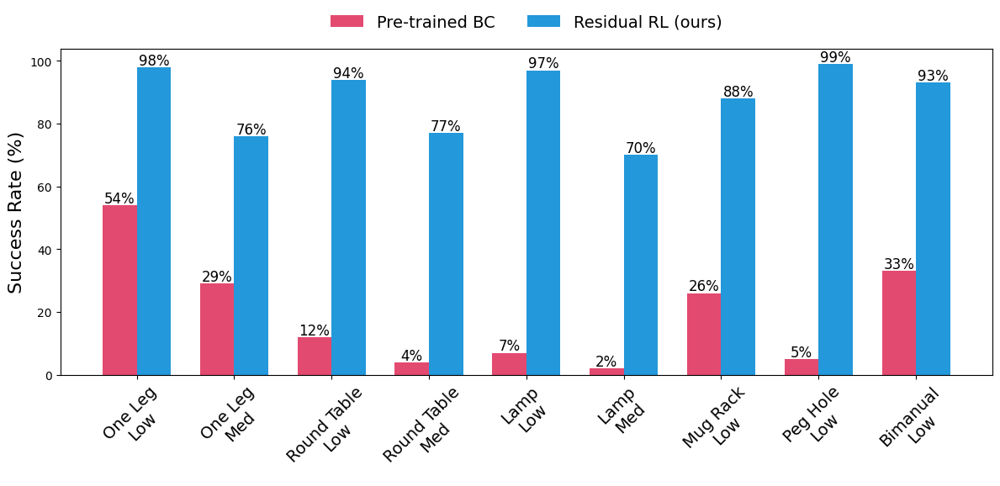

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Data for DP and ResiP
tasks = [
    "One Leg\nLow",
    "One Leg\nMed",
    "Round Table\nLow",
    "Round Table\nMed",
    "Lamp\nLow",
    "Lamp\nMed",
    "Mug Rack\nLow",
    "Peg Hole\nLow",
    "Bimanual\nLow",
]

dp_scores = [54, 29, 12, 4, 7, 2, 26, 5, 33]
resip_scores = [98, 76, 94, 77, 97, 70, 88, 99, 93]

# Set up the bar chart
x = np.arange(len(tasks))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(
    x - width / 2,
    dp_scores,
    width,
    label="Pre-trained BC",
    color="#E34A6F",
)
rects2 = ax.bar(
    x + width / 2,
    resip_scores,
    width,
    label="Residual RL (ours)",
    color="#2398DA",
)


# Add value labels on top of bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(
            f"{int(height)}%",
            xy=(rect.get_x() + rect.get_width() / 2, height - 1),
            xytext=(0, 2),  # 3 points vertical offset
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=12,
        )


autolabel(rects1)
autolabel(rects2)

# Customize the plot
ax.set_ylabel("Success Rate (%)", fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(tasks, rotation=45, ha="center", fontsize=14)

# Place legend horizontally at the top of the plot
ax.legend(
    frameon=False,
    fontsize=14,
    ncol=2,  # This makes the legend horizontal
    loc="upper center",
    bbox_to_anchor=(0.5, 1.15),  # Adjusted to prevent overlap
)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Display the plot
plt.show()